# Data Scraping

Movie - Protagonist

In [ ]:
pip install aiohttp asyncio pandas


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.8/101.8 kB 1.4 MB/s eta 0:00:00


Extracting Protagonists

In [ ]:
# 📌 Install required libraries (run only once in Colab)
!pip install aiohttp nest_asyncio

# 📦 Import libraries
import pandas as pd
import asyncio
import aiohttp
import re
import nest_asyncio

# ✅ Enable nested asyncio loops (required in notebooks)
nest_asyncio.apply()

# 🔑 Your TMDb API key here
API_KEY = "53f8340e08e833abae74ed4683f07ee0"  # Replace with your actual TMDb key

# 🌐 TMDb API endpoints
SEARCH_URL = "https://api.themoviedb.org/3/search/movie"
CREDITS_URL_TEMPLATE = "https://api.themoviedb.org/3/movie/{}/credits"

# 📄 Load and clean your dataset
df = pd.read_csv("movies.csv")  # If you're using Colab, upload your file first
df["clean_title"] = df["title"].apply(lambda x: re.sub(r"\s*\(\d{4}\)$", "", x).strip())
titles = df["clean_title"].tolist()

# 🧱 Split into batches (40 per batch to stay under rate limits)
BATCH_SIZE = 40
batches = [titles[i:i + BATCH_SIZE] for i in range(0, len(titles), BATCH_SIZE)]

# 🚀 Asynchronous function to fetch top 3 protagonists
async def fetch_cast(session, title):
    try:
        params = {"api_key": API_KEY, "query": title}
        async with session.get(SEARCH_URL, params=params) as res:
            search_data = await res.json()
            if not search_data["results"]:
                return title, ["Not Found"] * 3
            movie_id = search_data["results"][0]["id"]

        credits_url = CREDITS_URL_TEMPLATE.format(movie_id)
        async with session.get(credits_url, params={"api_key": API_KEY}) as res:
            credits_data = await res.json()
            cast = credits_data.get("cast", [])[:3]
            protagonists = [actor["name"] for actor in cast] + [""] * (3 - len(cast))
            return title, protagonists
    except Exception as e:
        return title, [f"Error: {e}"] * 3

# 🎬 Process one batch
async def process_batch(batch):
    async with aiohttp.ClientSession() as session:
        tasks = [fetch_cast(session, title) for title in batch]
        return await asyncio.gather(*tasks)

# 🔄 Master async function to run all batches
async def run_all_batches():
    final_results = []
    for i, batch in enumerate(batches):
        print(f"Processing batch {i+1}/{len(batches)}...")
        result = await process_batch(batch)
        final_results.extend(result)
        if i < len(batches) - 1:
            print("Waiting 10 seconds for next batch...")
            await asyncio.sleep(10)
    return final_results

# 🚀 Run everything
results = await run_all_batches()

# 💾 Save to CSV
output_df = pd.DataFrame(results, columns=["Movie Name", "Protagonists"])
output_df.to_csv("movie_protagonists.csv", index=False)
print("✅ Protagonist data saved to 'movie_protagonists.csv'")


Processing batch 1/244...
Waiting 10 seconds for next batch...
Processing batch 2/244...
Waiting 10 seconds for next batch...
Processing batch 3/244...
Waiting 10 seconds for next batch...
Processing batch 4/244...
Waiting 10 seconds for next batch...
Processing batch 5/244...
Waiting 10 seconds for next batch...
Processing batch 6/244...
Waiting 10 seconds for next batch...
Processing batch 7/244...
Waiting 10 seconds for next batch...
Processing batch 8/244...
Waiting 10 seconds for next batch...
Processing batch 9/244...
Waiting 10 seconds for next batch...
Processing batch 10/244...
Waiting 10 seconds for next batch...
Processing batch 11/244...
Waiting 10 seconds for next batch...
Processing batch 12/244...
Waiting 10 seconds for next batch...
Processing batch 13/244...
Waiting 10 seconds for next batch...
Processing batch 14/244...
Waiting 10 seconds for next batch...
Processing batch 15/244...
Waiting 10 seconds for next batch...
Processing batch 16/244...
Waiting 10 seconds for

ValueError: 4 columns passed, passed data had 2 columns

In [ ]:
print(len(results[0]))  # Check number of columns in the first row
print(results[:5])  # View a sample of the results


2
[('Toy Story', ['Tom Hanks', 'Tim Allen', 'Don Rickles']), ('Jumanji', ['Robin Williams', 'Kirsten Dunst', 'Bradley Pierce']), ('Grumpier Old Men', ['Walter Matthau', 'Jack Lemmon', 'Ann-Margret']), ('Waiting to Exhale', ['Whitney Houston', 'Angela Bassett', 'Loretta Devine']), ('Father of the Bride Part II', ['Steve Martin', 'Diane Keaton', 'Martin Short'])]


In [ ]:
# 💾 Save to CSV
output_df = pd.DataFrame(results, columns=["Movie Name", "Protagonists"])
output_df.to_csv("movie_protagonists.csv", index=False)
print("✅ Protagonist data saved to 'movie_protagonists.csv'")


✅ Protagonist data saved to 'movie_protagonists.csv'


combining protagonist and movie ratings

In [ ]:
# 📦 Import required libraries
import pandas as pd

# 📁 Upload your two CSV files:
# 1. movie_protagonists.csv (contains: movieId, title, protagonist_1, protagonist_2, protagonist_3)
# 2. movie_ratings.csv (contains: movieId, title, rating)
from google.colab import files
uploaded = files.upload()

# 📄 Load the files into DataFrames
protagonists_df = pd.read_csv("movie_protagonists.csv")
ratings_df = pd.read_csv("ratings.csv")

# 🔄 Merge the datasets on 'movieId' (and optionally 'title' if you want stricter matching)
merged_df = pd.merge(protagonists_df, ratings_df, on="movieId", how="inner")

# 🎯 Optional: Remove duplicate title columns if present
if 'title_x' in merged_df.columns and 'title_y' in merged_df.columns:
    merged_df.drop(columns=['title_y'], inplace=True)
    merged_df.rename(columns={'title_x': 'title'}, inplace=True)

# 📊 Display the first few rows
print(merged_df.head())

# 💾 Save the final merged dataset
merged_df.to_csv("movies_with_protagonists_and_ratings.csv", index=False)
print("✅ Merged dataset saved as 'movies_with_protagonists_and_ratings.csv'")


# Analyzing Communities based on modularity class

In [ ]:
import pandas as pd

# Load the Gephi node data (community detection)
nodes_df = pd.read_csv('community_detection_full.csv')
nodes_df['movieId'] = nodes_df['Id']  # Align ID for merging

# Load movies data (movieId, title, genres)
movies_df = pd.read_csv('movies.csv')

# Load protagonist data
protagonists_df = pd.read_csv('movie_protagonists.csv')

# Merge movies and protagonists on movieId
movies_with_protagonists = pd.merge(movies_df, protagonists_df, on='movieId', how='inner')

# Merge with community detection data
full_merged_df = pd.merge(nodes_df, movies_with_protagonists, on='movieId', how='inner')

# Combine protagonist columns
protagonist_cols = [col for col in full_merged_df.columns if 'Protagonist' in col]
full_merged_df['Protagonists'] = full_merged_df.apply(
    lambda row: ', '.join([row[col] for col in protagonist_cols if pd.notna(row[col]) and row[col].strip().lower() != 'not found']),
    axis=1
)

# Save the merged data for reference
full_merged_df.to_csv('movies_with_communities_and_protagonists.csv', index=False)

# Display the relevant columns
print(full_merged_df[['movieId', 'title', 'Protagonists', 'modularity_class', 'stat_inf_class']].head())


   movieId                       title  \
0        1            Toy Story (1995)   
1     1029                Dumbo (1941)   
2     1032  Alice in Wonderland (1951)   
3     1042   That Thing You Do! (1996)   
4     1060             Swingers (1996)   

                                        Protagonists  modularity_class  \
0          ['Tom Hanks', 'Tim Allen', 'Don Rickles']                 1   
1  ['Edward Brophy', 'Margaret Wright', 'Verna Fe...                 1   
2  ['Mia Wasikowska', 'Johnny Depp', 'Anne Hathaw...                 1   
3    ['Tom Hanks', 'Tom Everett Scott', 'Liv Tyler']                 1   
4  ['Ellen van der Koogh', 'Nienke Brinkhuis', 'D...                 0   

   stat_inf_class  
0             101  
1             235  
2              47  
3              96  
4              43  


Extracting Protagonists

In [ ]:
from collections import Counter

# Function to count protagonists per modularity class
def analyze_protagonists_per_community(df):
    # Dictionary to store protagonist counts per community
    community_protagonists = {}

    # Iterate over each community
    for community_id in df['modularity_class'].unique():
        # Filter movies in this community
        community_movies = df[df['modularity_class'] == community_id]

        # List to hold all protagonists in this community
        protagonist_list = []

        for _, row in community_movies.iterrows():
            for col in ['Protagonist 1', 'Protagonist 2', 'Protagonist 3']:
                if col in df.columns and pd.notna(row[col]) and row[col].strip().lower() != 'not found':
                    protagonist_list.append(row[col].strip())

        # Count protagonist occurrences
        protagonist_counts = Counter(protagonist_list)
        community_protagonists[community_id] = protagonist_counts

    return community_protagonists

# Run the analysis on your full merged dataframe
protagonist_counts_by_community = analyze_protagonists_per_community(full_merged_df)

# Print results
for community_id, protagonist_counts in protagonist_counts_by_community.items():
    print(f"🎬 Community {community_id} ({len(full_merged_df[full_merged_df['modularity_class'] == community_id])} movies):")
    print(protagonist_counts.most_common())
    print()


🎬 Community 1 (242 movies):
[]

🎬 Community 0 (324 movies):
[]

🎬 Community 2 (360 movies):
[]



In [ ]:
from collections import Counter
import pandas as pd

def analyze_protagonists_per_community(df):
    community_protagonists = {}

    # Iterate over each community
    for community_id in df['modularity_class'].unique():
        # Filter movies in this community
        community_movies = df[df['modularity_class'] == community_id]

        # Count how many times each actor appears
        actor_counter = Counter()
        for actors in community_movies['Protagonists']:
            if pd.notna(actors) and actors.strip():
                actor_list = actors.split('|')
                actor_counter.update(actor_list)

        community_protagonists[community_id] = {
            'num_movies': len(community_movies),
            'actor_counts': actor_counter
        }

    return community_protagonists

# Run the analysis
community_actor_data = analyze_protagonists_per_community(merged_df)

# Print results
for community_id, data in community_actor_data.items():
    print(f"\nCommunity {community_id} ({data['num_movies']} movies):")
    for actor, count in data['actor_counts'].most_common():
        print(f"  {actor}: {count} movie(s)")



Community 1 (242 movies):
  ['Not Found', 'Not Found', 'Not Found']: 6 movie(s)
  ['', '', '']: 2 movie(s)
  ['Audrey Hepburn', 'William Holden', 'Humphrey Bogart']: 2 movie(s)
  ['Tom Hanks', 'Tim Allen', 'Don Rickles']: 1 movie(s)
  ['Edward Brophy', 'Margaret Wright', 'Verna Felton']: 1 movie(s)
  ['Mia Wasikowska', 'Johnny Depp', 'Anne Hathaway']: 1 movie(s)
  ['Tom Hanks', 'Tom Everett Scott', 'Liv Tyler']: 1 movie(s)
  ['Mel Stuart', 'David L. Wolper', 'Roald Dahl']: 1 movie(s)
  ['Michael Douglas', 'Sharon Stone', 'George Dzundza']: 1 movie(s)
  ['Mel Gibson', 'Catherine McCormack', 'Sophie Marceau']: 1 movie(s)
  ['Daniel Day-Lewis', 'Madeleine Stowe', 'Jodhi May']: 1 movie(s)
  ['Alex McArthur', 'David Warner', 'Yaphet Kotto']: 1 movie(s)
  ['Donnie Dunagan', 'Peter Behn', 'Stan Alexander']: 1 movie(s)
  ['Adam Sandler', 'Bradley Whitford', 'Josh Mostel']: 1 movie(s)
  ['Jim Carrey', 'Jeff Daniels', 'Laurie Holden']: 1 movie(s)
  ['Johnny Depp', 'Martin Landau', 'Sarah Jessic

Results

In [ ]:
for community_id, data in community_actor_data.items():
    actor_counts = data['actor_counts']
    total_appearances = sum(actor_counts.values())

    if total_appearances > 0:
        most_common_actor, count = actor_counts.most_common(1)[0]
        purity = count / total_appearances
        print(f"Community {community_id}: Most common protagonist = {most_common_actor} ({purity:.2%})")


Community 1: Most common protagonist = ['Not Found', 'Not Found', 'Not Found'] (2.48%)
Community 0: Most common protagonist = ['Not Found', 'Not Found', 'Not Found'] (1.54%)
Community 2: Most common protagonist = ['Daniel Radcliffe', 'Rupert Grint', 'Emma Watson'] (1.39%)


## Data scraping for one protagonist

In [ ]:
# 📌 Install required libraries (run only once in Colab)
!pip install aiohttp nest_asyncio

# 📦 Import libraries
import pandas as pd
import asyncio
import aiohttp
import nest_asyncio

# ✅ Enable nested asyncio loops (required in notebooks)
nest_asyncio.apply()

# 🔑 Your TMDb API key here
API_KEY = "53f8340e08e833abae74ed4683f07ee0"  # Replace with your actual TMDb key

# 🌐 TMDb API endpoint
CREDITS_URL_TEMPLATE = "https://api.themoviedb.org/3/movie/{}/credits"

# 📄 Load your dataset (make sure it has 'id' and 'title' columns)
df = pd.read_csv("movies.csv")  # Upload the file if you're using Colab
movie_ids = df["id"].tolist()
movie_titles = df["title"].tolist()

# 🧱 Split into batches (40 per batch to stay under rate limits)
BATCH_SIZE = 40
movie_batches = [(movie_ids[i:i + BATCH_SIZE], movie_titles[i:i + BATCH_SIZE]) for i in range(0, len(movie_ids), BATCH_SIZE)]

# 🚀 Asynchronous function to fetch top 1 protagonist by movie ID
async def fetch_main_protagonist(session, movie_id, title):
    try:
        credits_url = CREDITS_URL_TEMPLATE.format(movie_id)
        async with session.get(credits_url, params={"api_key": API_KEY}) as res:
            credits_data = await res.json()
            cast = credits_data.get("cast", [])
            protagonist = cast[0]["name"] if cast else "Not Found"
            return movie_id, title, protagonist
    except Exception as e:
        return movie_id, title, f"Error: {e}"

# 🎬 Process one batch
async def process_batch(batch_ids, batch_titles):
    async with aiohttp.ClientSession() as session:
        tasks = [fetch_main_protagonist(session, mid, title) for mid, title in zip(batch_ids, batch_titles)]
        return await asyncio.gather(*tasks)

# 🔄 Master async function to run all batches
async def run_all_batches():
    final_results = []
    for i, (batch_ids, batch_titles) in enumerate(movie_batches):
        print(f"Processing batch {i+1}/{len(movie_batches)}...")
        result = await process_batch(batch_ids, batch_titles)
        final_results.extend(result)
        if i < len(movie_batches) - 1:
            print("Waiting 10 seconds for next batch...")
            await asyncio.sleep(10)
    return final_results

# 🚀 Run everything
results = await run_all_batches()

# 💾 Save to CSV
output_df = pd.DataFrame(results, columns=["movieId", "title", "Protagonist"])
output_df.to_csv("movie_protagonists_with_ids.csv", index=False)
print("✅ Main protagonist data saved to 'movie_protagonists_with_ids.csv'")


Processing batch 1/244...
Waiting 10 seconds for next batch...
Processing batch 2/244...
Waiting 10 seconds for next batch...
Processing batch 3/244...
Waiting 10 seconds for next batch...
Processing batch 4/244...
Waiting 10 seconds for next batch...
Processing batch 5/244...
Waiting 10 seconds for next batch...
Processing batch 6/244...
Waiting 10 seconds for next batch...
Processing batch 7/244...
Waiting 10 seconds for next batch...
Processing batch 8/244...
Waiting 10 seconds for next batch...
Processing batch 9/244...
Waiting 10 seconds for next batch...
Processing batch 10/244...
Waiting 10 seconds for next batch...
Processing batch 11/244...
Waiting 10 seconds for next batch...
Processing batch 12/244...
Waiting 10 seconds for next batch...
Processing batch 13/244...
Waiting 10 seconds for next batch...
Processing batch 14/244...
Waiting 10 seconds for next batch...
Processing batch 15/244...
Waiting 10 seconds for next batch...
Processing batch 16/244...
Waiting 10 seconds for

In [ ]:
# 💾 Save to CSV
output_df = pd.DataFrame(results, columns=["Movie Name","movieId", "Protagonist"])
output_df.to_csv("movie_protagonists_with_ids.csv", index=False)
print("✅ Main lead protagonist data with movie IDs saved to 'movie_protagonists_with_ids.csv'")

✅ Main lead protagonist data with movie IDs saved to 'movie_protagonists_with_ids.csv'


Analyzing Communities based on modularity class- P1

In [ ]:
import pandas as pd

# Load the Gephi node data (community detection)
nodes_df = pd.read_csv('community_detection_full.csv')
nodes_df['movieId'] = nodes_df['Id']  # Align ID for merging

# Load movies data (movieId, title, genres)
movies_df = pd.read_csv('movies.csv')

# Load protagonist data
protagonists_df = pd.read_csv('movie_protagonists_with_ids.csv')

# Merge movies and protagonists on movieId
movies_with_protagonists = pd.merge(movies_df, protagonists_df, on='movieId', how='inner')

# Merge with community detection data
full_merged_df = pd.merge(nodes_df, movies_with_protagonists, on='movieId', how='inner')

# Combine protagonist columns
protagonist_cols = [col for col in full_merged_df.columns if 'Protagonist' in col]
full_merged_df['Protagonists'] = full_merged_df.apply(
    lambda row: ', '.join([row[col] for col in protagonist_cols if pd.notna(row[col]) and row[col].strip().lower() != 'not found']),
    axis=1
)

# Save the merged data for reference
full_merged_df.to_csv('movies_with_communities_and_P1.csv', index=False)

# Display the relevant columns
print(full_merged_df[['movieId', 'title', 'Protagonists', 'modularity_class', 'stat_inf_class']].head())


   movieId                       title         Protagonists  modularity_class  \
0        1            Toy Story (1995)            Tom Hanks                 1   
1     1029                Dumbo (1941)        Edward Brophy                 1   
2     1032  Alice in Wonderland (1951)       Mia Wasikowska                 1   
3     1042   That Thing You Do! (1996)            Tom Hanks                 1   
4     1060             Swingers (1996)  Ellen van der Koogh                 0   

   stat_inf_class  
0             101  
1             235  
2              47  
3              96  
4              43  


Extracting Protagonists

In [ ]:
from collections import Counter

# 📄 Load your cleaned dataset (make sure to upload this if on Colab)
merged_df = pd.read_csv("movies_with_communities_and_P1.csv")  # Change filename if needed


# Function to count protagonists per modularity class
def analyze_protagonists_per_community(df):
    # Dictionary to store protagonist counts per community
    community_protagonists = {}

    # Iterate over each community
    for community_id in df['modularity_class'].unique():
        # Filter movies in this community
        community_movies = df[df['modularity_class'] == community_id]

        # List to hold all protagonists in this community
        protagonist_list = []

        for _, row in community_movies.iterrows():
            for col in ['Protagonist 1', 'Protagonist 2', 'Protagonist 3']:
                if col in df.columns and pd.notna(row[col]) and row[col].strip().lower() != 'not found':
                    protagonist_list.append(row[col].strip())

        # Count protagonist occurrences
        protagonist_counts = Counter(protagonist_list)
        community_protagonists[community_id] = protagonist_counts

    return community_protagonists

# Run the analysis on your full merged dataframe
protagonist_counts_by_community = analyze_protagonists_per_community(full_merged_df)

# Print results
for community_id, protagonist_counts in protagonist_counts_by_community.items():
    print(f"🎬 Community {community_id} ({len(full_merged_df[full_merged_df['modularity_class'] == community_id])} movies):")
    print(protagonist_counts.most_common())
    print()


🎬 Community 1 (242 movies):
[]

🎬 Community 0 (324 movies):
[]

🎬 Community 2 (360 movies):
[]



In [ ]:
from collections import Counter
import pandas as pd

# 📄 Load your cleaned dataset (make sure to upload this if on Colab)
merged_df = pd.read_csv("movies_with_communities_and_P1.csv")  # Change filename if needed

# ✅ Function to analyze protagonist frequency per community
def analyze_protagonists_per_community(df):
    community_protagonists = {}

    # Iterate over each community
    for community_id in df['modularity_class'].unique():
        # Filter movies in this community
        community_movies = df[df['modularity_class'] == community_id]

        # Count how many times each actor appears as protagonist
        actor_counter = Counter()
        for actor in community_movies['Protagonist']:
            if pd.notna(actor) and actor.strip() and actor != "Not Found":
                actor_counter[actor] += 1

        # Store community data
        community_protagonists[community_id] = {
            'num_movies': len(community_movies),
            'actor_counts': actor_counter
        }

    return community_protagonists

# 🔍 Run analysis
community_actor_data = analyze_protagonists_per_community(merged_df)

# 📊 Print results
for community_id, data in community_actor_data.items():
    print(f"\n🎬 Community {community_id} ({data['num_movies']} movies):")
    if data['actor_counts']:
        for actor, count in data['actor_counts'].most_common():
            print(f"  ⭐ {actor}: {count} movie(s)")
    else:
        print("  ⚠️ No valid protagonist data found.")



🎬 Community 1 (242 movies):
  ⭐ Tom Hanks: 5 movie(s)
  ⭐ Mel Gibson: 5 movie(s)
  ⭐ Jim Carrey: 5 movie(s)
  ⭐ Michael Douglas: 4 movie(s)
  ⭐ Adam Sandler: 4 movie(s)
  ⭐ Kevin Costner: 4 movie(s)
  ⭐ Arnold Schwarzenegger: 4 movie(s)
  ⭐ Sylvester Stallone: 4 movie(s)
  ⭐ Johnny Depp: 3 movie(s)
  ⭐ John Travolta: 3 movie(s)
  ⭐ Robin Williams: 3 movie(s)
  ⭐ Kurt Russell: 3 movie(s)
  ⭐ Al Pacino: 3 movie(s)
  ⭐ Sean Connery: 3 movie(s)
  ⭐ Meg Ryan: 3 movie(s)
  ⭐ Ralph Fiennes: 3 movie(s)
  ⭐ Audrey Hepburn: 3 movie(s)
  ⭐ Michael Keaton: 2 movie(s)
  ⭐ Tom Cruise: 2 movie(s)
  ⭐ Hugh Grant: 2 movie(s)
  ⭐ Richard Gere: 2 movie(s)
  ⭐ Robert De Niro: 2 movie(s)
  ⭐ Dustin Hoffman: 2 movie(s)
  ⭐ Keanu Reeves: 2 movie(s)
  ⭐ Billy Crystal: 2 movie(s)
  ⭐ Kevin Bacon: 2 movie(s)
  ⭐ Tim Robbins: 2 movie(s)
  ⭐ Meryl Streep: 2 movie(s)
  ⭐ Julia Roberts: 2 movie(s)
  ⭐ Eddie Murphy: 2 movie(s)
  ⭐ Edward Brophy: 1 movie(s)
  ⭐ Mia Wasikowska: 1 movie(s)
  ⭐ Mel Stuart: 1 movie(s)
 

## Histogram

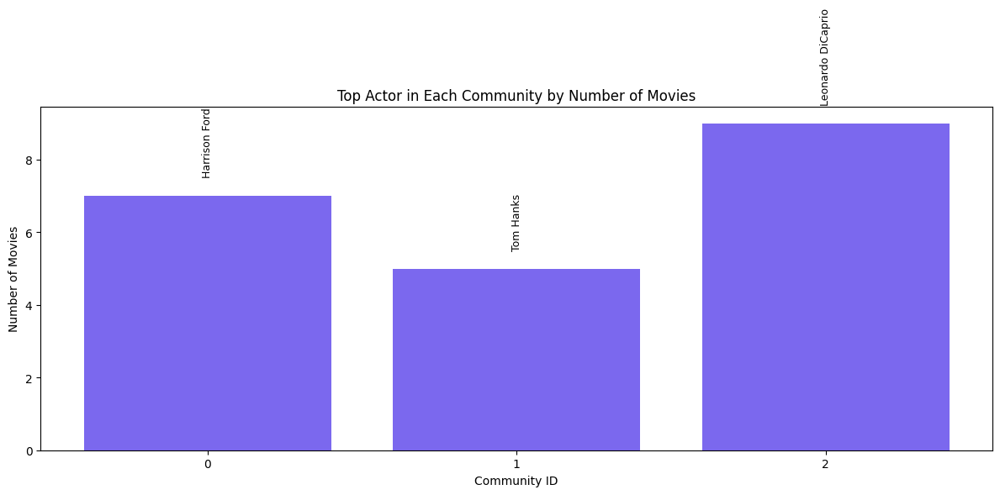

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter

# 📄 Load your cleaned dataset
merged_df = pd.read_csv("movies_with_communities_and_P1.csv")  # Ensure 'Protagonist' and 'modularity_class' columns exist

# ✅ Function to extract top protagonist per community
def get_top_actors_per_community(df):
    top_actors = {}

    for community_id in df['modularity_class'].unique():
        community_movies = df[df['modularity_class'] == community_id]
        actor_counter = Counter()
        for actor in community_movies['Protagonist']:
            if pd.notna(actor) and actor.strip() and actor != "Not Found":
                actor_counter[actor] += 1

        if actor_counter:
            top_actor, count = actor_counter.most_common(1)[0]
            top_actors[community_id] = (top_actor, count)

    return top_actors

# 🔍 Get top actors
top_actors_data = get_top_actors_per_community(merged_df)

# 🎨 Plot histogram
communities = list(top_actors_data.keys())
actors = [top_actors_data[c][0] for c in communities]
counts = [top_actors_data[c][1] for c in communities]

plt.figure(figsize=(12, 6))
bars = plt.bar(communities, counts, color='mediumslateblue')
plt.xlabel("Community ID")
plt.ylabel("Number of Movies")
plt.title("Top Actor in Each Community by Number of Movies")
plt.xticks(communities)

# 🏷️ Add actor names on top of bars
for bar, actor in zip(bars, actors):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5, actor, ha='center', va='bottom', fontsize=9, rotation=90)

plt.tight_layout()
plt.show()


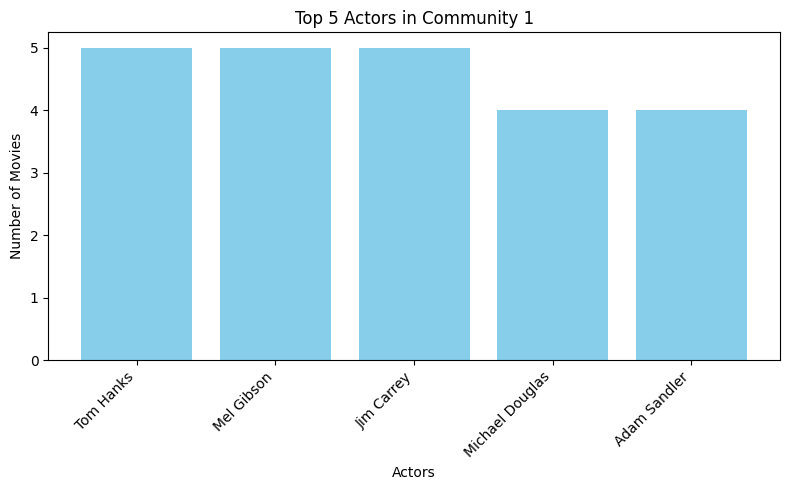

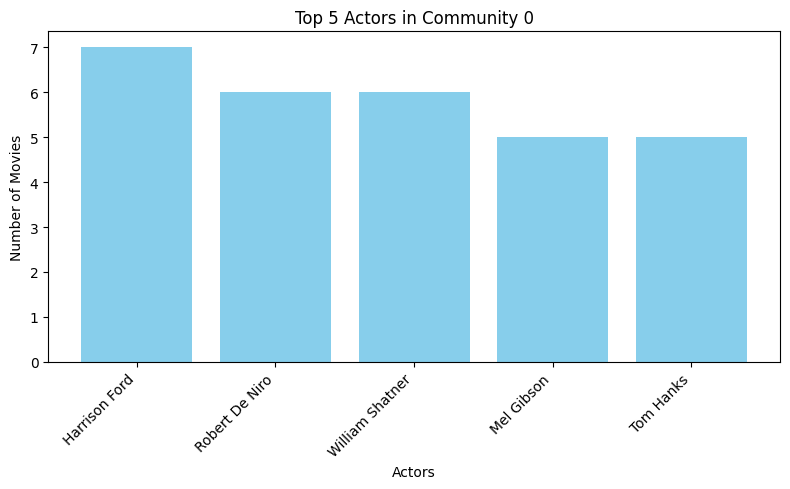

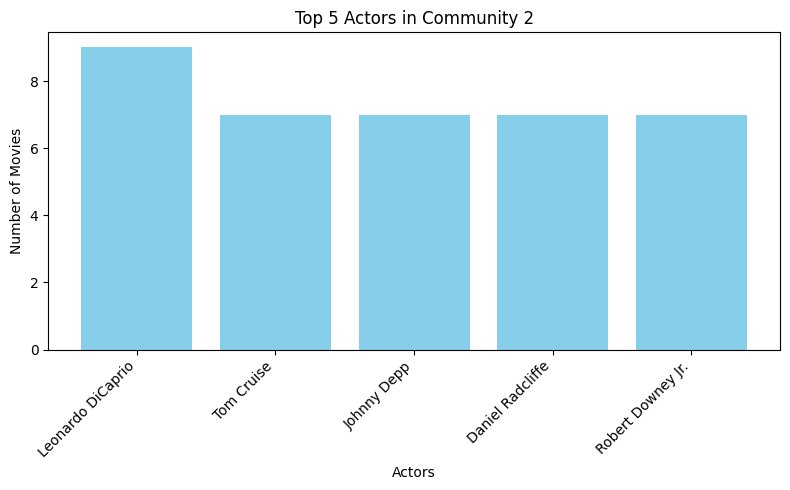

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter

# 📄 Load your dataset
merged_df = pd.read_csv("movies_with_communities_and_P1.csv")  # Make sure this file has 'Protagonist' and 'modularity_class'

# 🎯 Function to get actor counts per community
def get_actor_counts_per_community(df):
    community_actors = {}

    for community_id in df['modularity_class'].unique():
        community_movies = df[df['modularity_class'] == community_id]
        actor_counter = Counter()

        for actor in community_movies['Protagonist']:
            if pd.notna(actor) and actor.strip() and actor != "Not Found":
                actor_counter[actor] += 1

        community_actors[community_id] = actor_counter

    return community_actors

# ✅ Get actor data per community
community_actors = get_actor_counts_per_community(merged_df)

# 📊 Plot separate histogram for each community
for community_id, actor_counter in community_actors.items():
    if not actor_counter:
        continue

    top_actors = actor_counter.most_common(5)  # Top 5 actors
    actors, counts = zip(*top_actors)

    plt.figure(figsize=(8, 5))
    plt.bar(actors, counts, color='skyblue')
    plt.xlabel("Actors")
    plt.ylabel("Number of Movies")
    plt.title(f"Top 5 Actors in Community {community_id}")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()


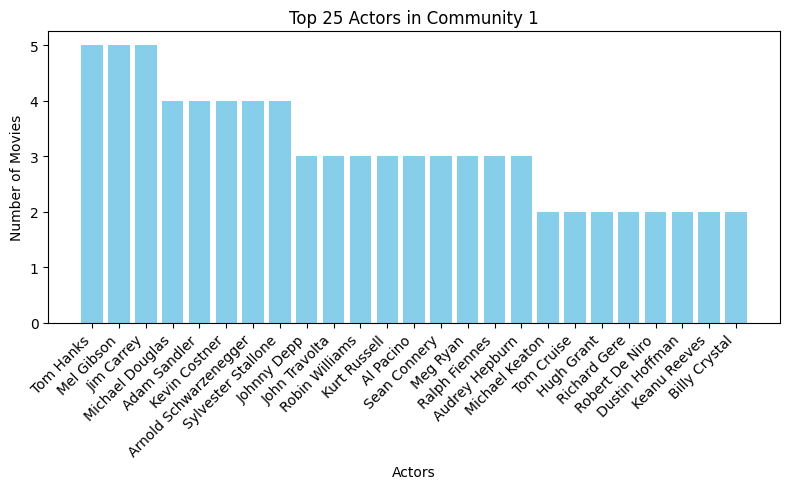

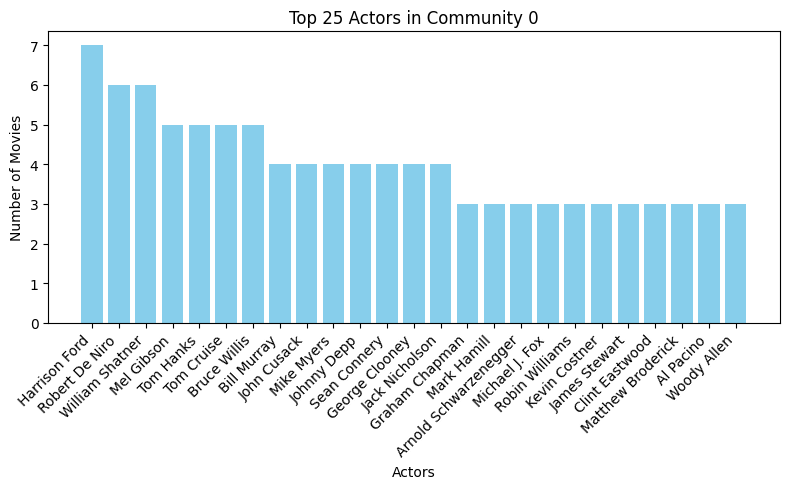

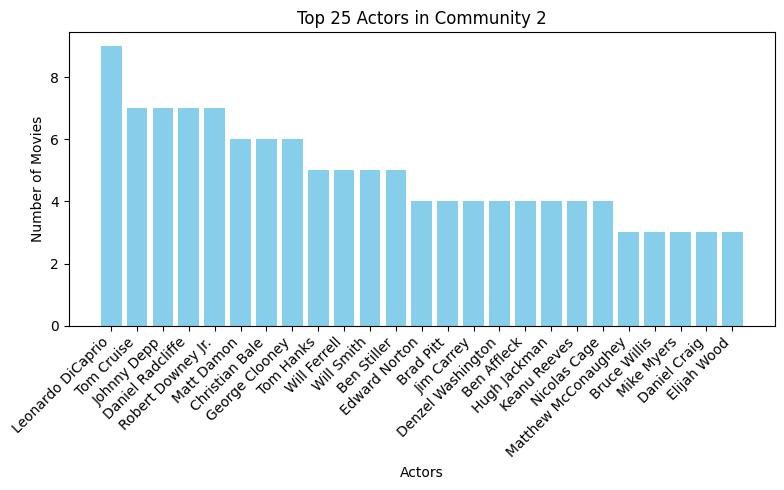

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter

# 📄 Load your dataset
merged_df = pd.read_csv("movies_with_communities_and_P1.csv")  # Make sure this file has 'Protagonist' and 'modularity_class'

# 🎯 Function to get actor counts per community
def get_actor_counts_per_community(df):
    community_actors = {}

    for community_id in df['modularity_class'].unique():
        community_movies = df[df['modularity_class'] == community_id]
        actor_counter = Counter()

        for actor in community_movies['Protagonist']:
            if pd.notna(actor) and actor.strip() and actor != "Not Found":
                actor_counter[actor] += 1

        community_actors[community_id] = actor_counter

    return community_actors

# ✅ Get actor data per community
community_actors = get_actor_counts_per_community(merged_df)

# 📊 Plot separate histogram for each community
for community_id, actor_counter in community_actors.items():
    if not actor_counter:
        continue

    top_actors = actor_counter.most_common(25)  # Top 5 actors
    actors, counts = zip(*top_actors)

    plt.figure(figsize=(8, 5))
    plt.bar(actors, counts, color='skyblue')
    plt.xlabel("Actors")
    plt.ylabel("Number of Movies")
    plt.title(f"Top 25 Actors in Community {community_id}")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()


# Analyzing Protagonists in Communities based on Inference class

One Protagonist

In [ ]:
import pandas as pd

# Load the data
protagonists_df = pd.read_csv('movie_protagonists_with_ids.csv')
nodes_df = pd.read_csv('community_detection_full.csv')
nodes_df['movieId'] = nodes_df['Id']

# Merge on movieId
merged_df = pd.merge(nodes_df, protagonists_df, on='movieId', how='inner')

# Analyze and print movies with their protagonists based on Inference Class
def print_movies_by_inference_class(df):
    grouped = df.groupby('stat_inf_class')
    for inf_class, group in grouped:
        print(f"\n📂 Inference Class {inf_class} - {len(group)} movies:")
        for _, row in group.iterrows():
            movie_name = row['Movie Name']
            # Handle dynamically named protagonist columns
            protagonist_cols = [col for col in df.columns if 'Protagonist' in col]
            protagonists = [row.get(col, '').strip() for col in protagonist_cols]
            protagonists = [p for p in protagonists if p != '' and p.lower() != 'not found']
            print(f"🎬 {movie_name} ➝ {', '.join(protagonists) if protagonists else 'No Protagonist Found'}")

# Run the analysis
print_movies_by_inference_class(merged_df)



📂 Inference Class 0 - 34 movies:
🎬 Star Wars: Episode IV - A New Hope ➝ Mark Hamill
🎬 Thin Red Line, The ➝ Jim Caviezel
🎬 JFK ➝ Kevin Costner
🎬 Grumpy Old Men ➝ Jack Lemmon
🎬 Breakfast at Tiffany's ➝ Audrey Hepburn
🎬 Pretty in Pink ➝ Molly Ringwald
🎬 Bowfinger ➝ Steve Martin
🎬 Multiplicity ➝ Michael Keaton
🎬 Frequency ➝ Dennis Quaid
🎬 U-571 ➝ Matthew McConaughey
🎬 Manchurian Candidate, The ➝ Frank Sinatra
🎬 Doors, The ➝ Daniel Brühl
🎬 Star Trek Into Darkness ➝ Chris Pine
🎬 Karate Kid, Part II, The ➝ Ralph Macchio
🎬 Bio-Dome ➝ Pauly Shore
🎬 Long Kiss Goodnight, The ➝ Geena Davis
🎬 Monty Python's And Now for Something Completely Different ➝ Graham Chapman
🎬 Saint, The ➝ Roberto Suárez
🎬 Spawn ➝ Michael Jai White
🎬 Stripes ➝ Bill Murray
🎬 Bull Durham ➝ Kevin Costner
🎬 Star Trek V: The Final Frontier ➝ William Shatner
🎬 Hercules ➝ Lou Ferrigno
🎬 Dr. Dolittle ➝ Kyla Pratt
🎬 Lost in Space ➝ William Hurt
🎬 Moonraker ➝ Roger Moore
🎬 Rush Hour 2 ➝ Jackie Chan
🎬 Resident Evil ➝ Kevin Dorman
🎬 B

## Histogram - Inference class

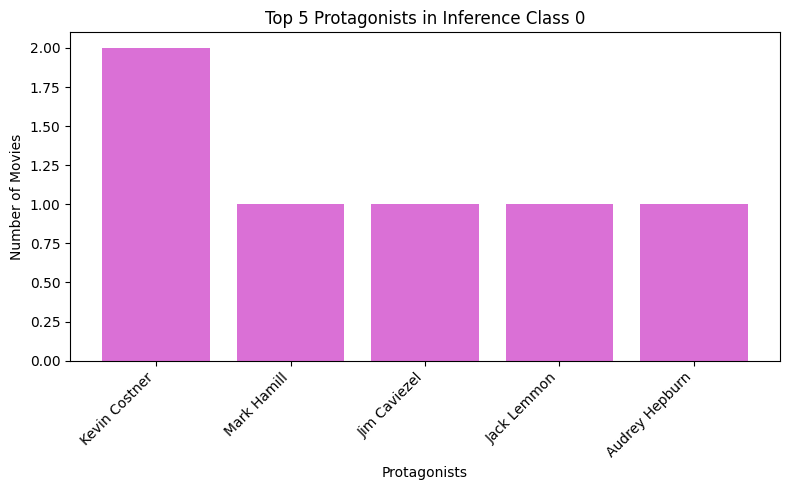

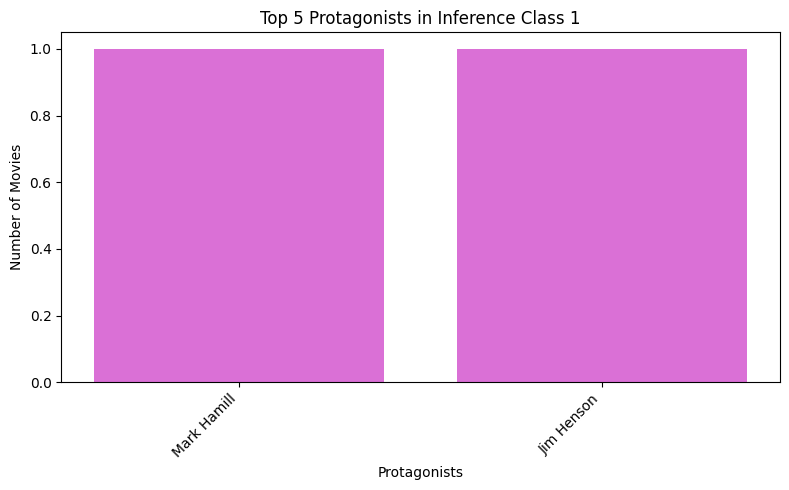

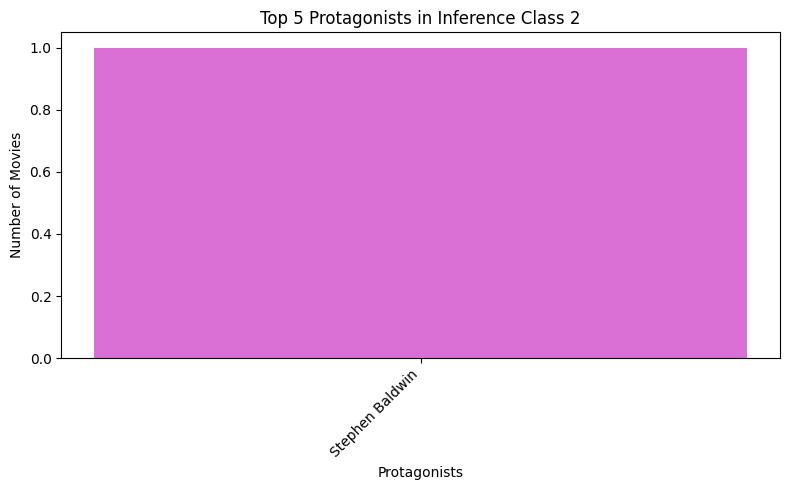

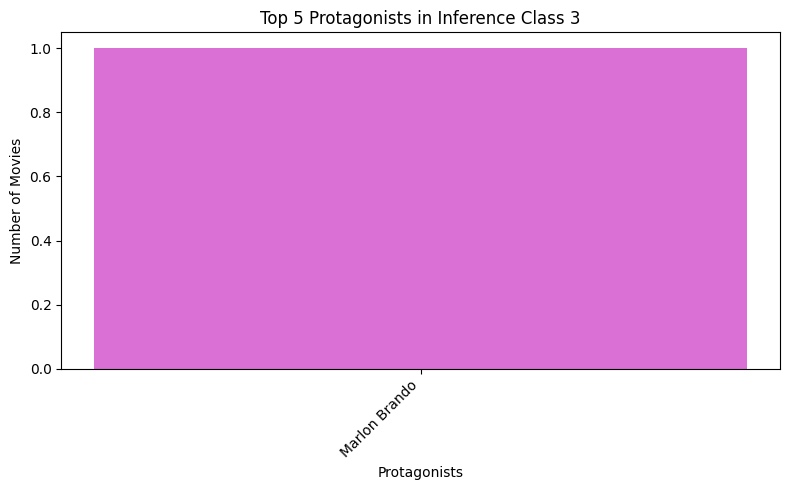

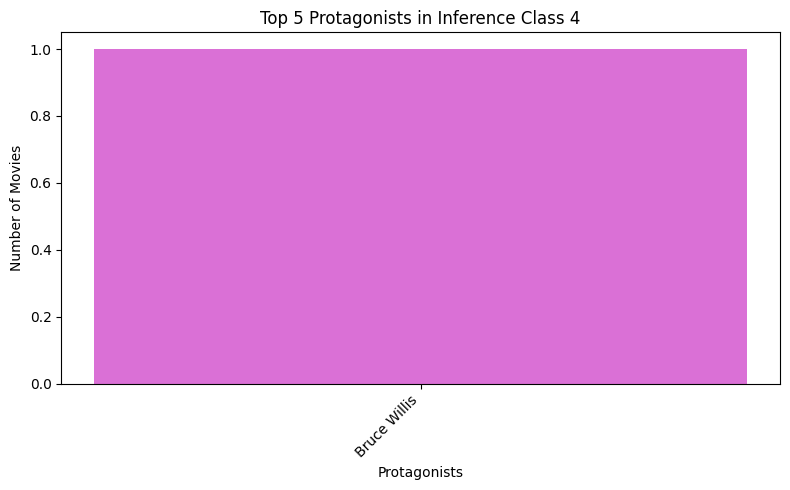

...

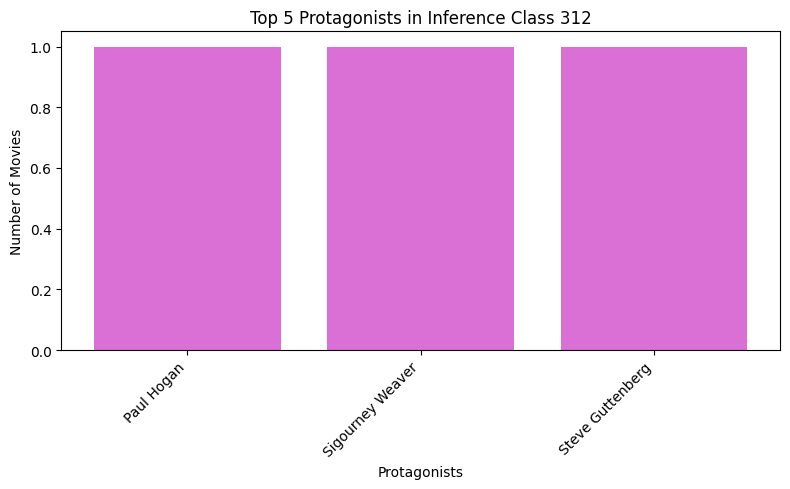

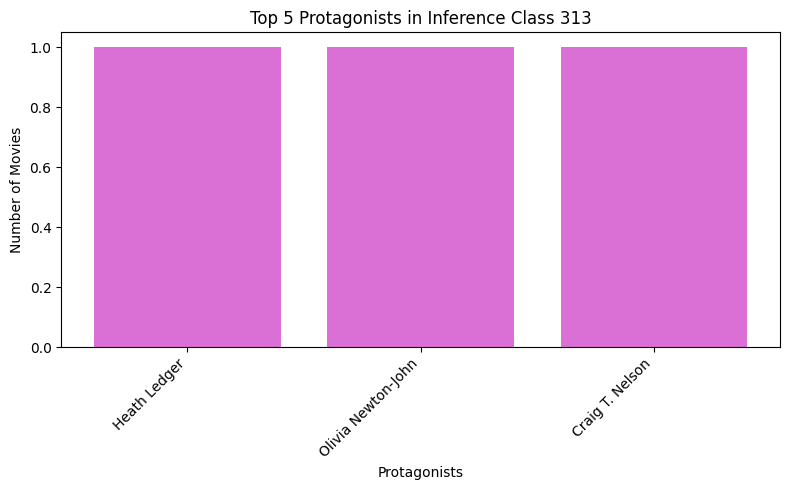

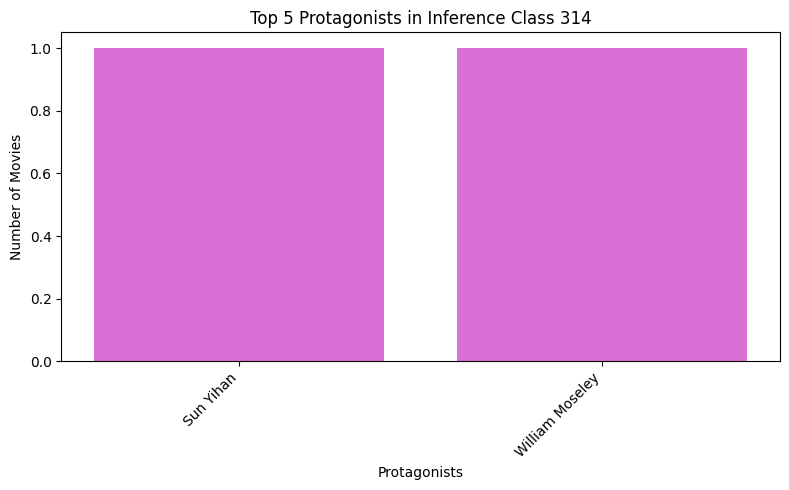

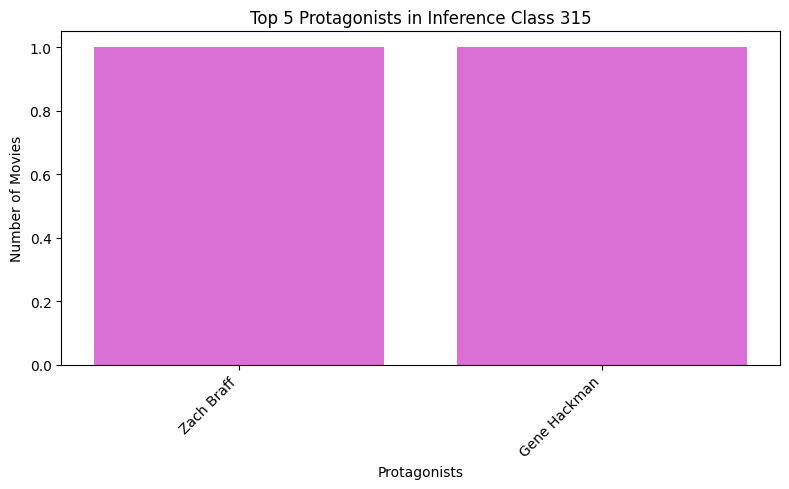

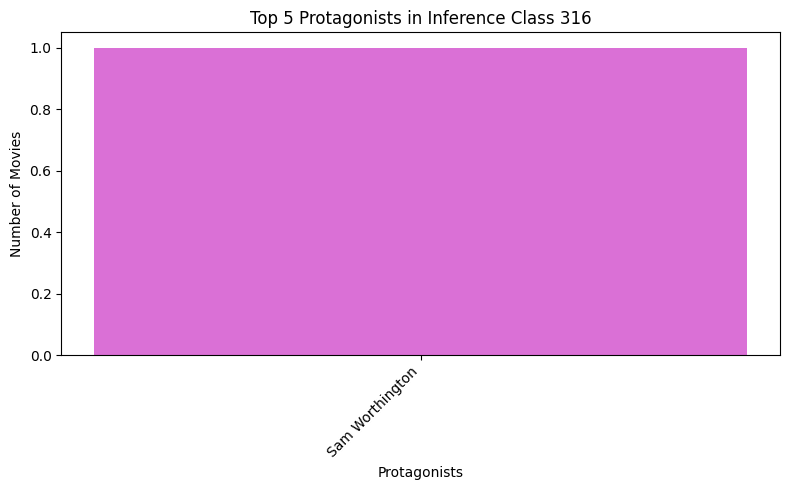

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter

# 📄 Load the data
protagonists_df = pd.read_csv('movie_protagonists_with_ids.csv')
nodes_df = pd.read_csv('community_detection_full.csv')
nodes_df['movieId'] = nodes_df['Id']

# 🔗 Merge on movieId
merged_df = pd.merge(nodes_df, protagonists_df, on='movieId', how='inner')

# 🎯 Extract protagonist columns dynamically
protagonist_cols = [col for col in merged_df.columns if 'Protagonist' in col]

# 📊 Analyze and plot histograms by Inference Class
def plot_protagonist_histograms_by_inference_class(df, top_n=5):
    grouped = df.groupby('stat_inf_class')

    for inf_class, group in grouped:
        actor_counter = Counter()

        for _, row in group.iterrows():
            for col in protagonist_cols:
                actor = row.get(col, '').strip()
                if actor and actor.lower() != 'not found':
                    actor_counter[actor] += 1

        if not actor_counter:
            continue

        # 🔝 Get top N protagonists
        top_actors = actor_counter.most_common(top_n)
        actors, counts = zip(*top_actors)

        # 📈 Plotting
        plt.figure(figsize=(8, 5))
        plt.bar(actors, counts, color='orchid')
        plt.xlabel("Protagonists")
        plt.ylabel("Number of Movies")
        plt.title(f"Top {top_n} Protagonists in Inference Class {inf_class}")
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

# 🚀 Run the function
plot_protagonist_histograms_by_inference_class(merged_df, top_n=5)


Top 3 Protagonists


In [ ]:
import pandas as pd

# Load the data
protagonists_df = pd.read_csv('movie_protagonists.csv')
nodes_df = pd.read_csv('community_detection_full.csv')
nodes_df['movieId'] = nodes_df['Id']

# Merge on movieId
merged_df = pd.merge(nodes_df, protagonists_df, on='movieId', how='inner')

# Analyze and print movies with their protagonists based on Inference Class
def print_movies_by_inference_class(df):
    grouped = df.groupby('stat_inf_class')
    for inf_class, group in grouped:
        print(f"\n📂 Inference Class {inf_class} - {len(group)} movies:")
        for _, row in group.iterrows():
            movie_name = row['Movie Name']
            # Handle dynamically named protagonist columns
            protagonist_cols = [col for col in df.columns if 'Protagonist' in col]
            protagonists = [row.get(col, '').strip() for col in protagonist_cols]
            protagonists = [p for p in protagonists if p != '' and p.lower() != 'not found']
            print(f"🎬 {movie_name} ➝ {', '.join(protagonists) if protagonists else 'No Protagonist Found'}")

# Run the analysis
print_movies_by_inference_class(merged_df)



📂 Inference Class 0 - 34 movies:
🎬 Star Wars: Episode IV - A New Hope ➝ ['Mark Hamill', 'Harrison Ford', 'Carrie Fisher']
🎬 Thin Red Line, The ➝ ['Jim Caviezel', 'Sean Penn', 'Nick Nolte']
🎬 JFK ➝ ['Kevin Costner', 'Tommy Lee Jones', 'Gary Oldman']
🎬 Grumpy Old Men ➝ ['Jack Lemmon', 'Walter Matthau', 'Ann-Margret']
🎬 Breakfast at Tiffany's ➝ ['Audrey Hepburn', 'George Peppard', 'Patricia Neal']
🎬 Pretty in Pink ➝ ['Molly Ringwald', 'Andrew McCarthy', 'Jon Cryer']
🎬 Bowfinger ➝ ['Steve Martin', 'Eddie Murphy', 'Heather Graham']
🎬 Multiplicity ➝ ['Michael Keaton', 'Andie MacDowell', 'Harris Yulin']
🎬 Frequency ➝ ['Dennis Quaid', 'Jim Caviezel', 'Shawn Doyle']
🎬 U-571 ➝ ['Matthew McConaughey', 'Bill Paxton', 'Harvey Keitel']
🎬 Manchurian Candidate, The ➝ ['Frank Sinatra', 'Laurence Harvey', 'Angela Lansbury']
🎬 Doors, The ➝ ['Daniel Brühl', 'Peter Kurth', 'Rike Eckermann']
🎬 Star Trek Into Darkness ➝ ['Chris Pine', 'Zachary Quinto', 'Zoe Saldaña']
🎬 Karate Kid, Part II, The ➝ ['Ralph Mac